<a href="https://colab.research.google.com/github/Shao-Chi-Wu/signal_final/blob/main/final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os

if not os.path.exists('thinkdsp.py'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/thinkdsp.py 

In [ ]:
if not os.path.exists('yt1s (online-audio-converter.com).wav'):
    !wget https://github.com/AllenDowney/ThinkDSP/blob/master/code/100475__iluppai__saxophone-weep.wav

In [ ]:
from thinkdsp import read_wave

wave = read_wave('yt1s (online-audio-converter.com).wav')
wave.normalize()
wave.make_audio()

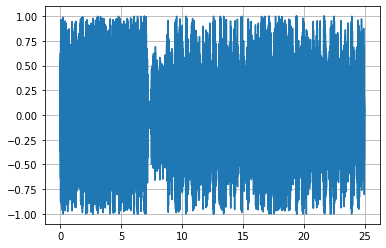

In [ ]:
wave.plot()
import matplotlib.pyplot as plt
plt.grid(True)

In [ ]:
segment = wave.segment(start=1.2, duration=1)
segment.make_audio()

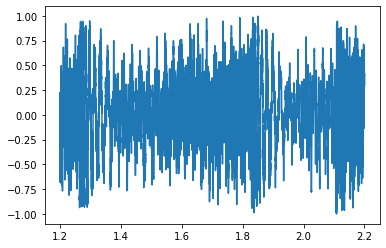

In [ ]:
segment.plot()

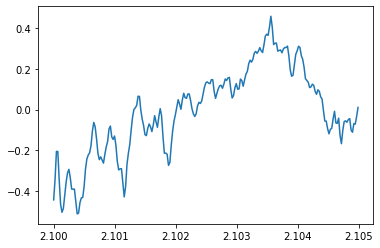

In [ ]:
import matplotlib.pyplot as plt
segment.segment(start=1.1, duration=0.005).plot()

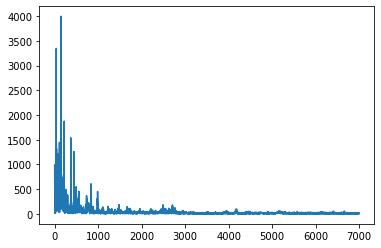

In [ ]:
spectrum = segment.make_spectrum() 
spectrum.plot(high=7000)

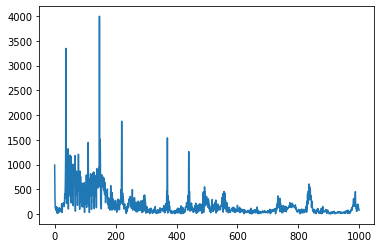

In [ ]:
spectrum = segment.make_spectrum()
spectrum.plot(high=1000)

In [ ]:
spectrum.peaks()[:30]

[(3997.527558294276, 147.0),
 (3347.294581619299, 37.0),
 (1876.0087994204664, 220.0),
 (1539.5719321034833, 370.0),
 (1511.2420979690453, 149.0),
 (1447.9070856560975, 110.0),
 (1319.5234055988692, 44.0),
 (1262.8847031836754, 440.0),
 (1235.884184864208, 150.0),
 (1210.1343020276481, 78.0),
 (1191.306138851197, 51.0),
 (1181.723233940957, 67.0),
 (1171.216669584414, 53.0),
 (1165.900450068977, 36.0),
 (1098.0100044383794, 46.0),
 (1067.2258779287135, 48.0),
 (1007.9366277570931, 60.0),
 (991.2711791992188, 0.0),
 (945.1726896360755, 145.0),
 (928.9416199356053, 58.0),
 (919.9646086447486, 138.0),
 (887.6735976408121, 55.0),
 (879.654604763953, 69.0),
 (876.8442959498768, 50.0),
 (870.3135288700983, 83.0),
 (864.1688522166055, 139.0),
 (848.5958461130787, 127.0),
 (846.2373313455058, 74.0),
 (840.6829546095248, 129.0),
 (826.8143117278844, 65.0)]

In [ ]:
from thinkdsp import decorate
from IPython.display import display

def filter_wave(wave, start, duration, cutoff):
    """Selects a segment from the wave and filters it.
    
    Plots the spectrum and displays an Audio widget.
    
    wave: Wave object
    start: time in s
    duration: time in s
    cutoff: frequency in Hz
    """
    segment = wave.segment(start, duration)
    spectrum = segment.make_spectrum()

    spectrum.plot(high=5000, color='0.7')
    spectrum.low_pass(cutoff)
    spectrum.plot(high=5000, color='#045a8d')
    decorate(xlabel='Frequency (Hz)')
    
    audio = spectrum.make_wave().make_audio()
    display(audio)

In [ ]:
from ipywidgets import interact, fixed

interact(filter_wave, wave=fixed(wave), 
         start=(0, 5, 0.1), duration=(0, 5, 0.1), cutoff=(0, 5000, 100));

interactive(children=(FloatSlider(value=2.0, description='start', max=5.0), FloatSlider(value=2.0, description…

In [ ]:
wave3 = read_wave('yt1s (online-audio-converter.com).wav')
wave3.normalize()
wave3.make_audio()

In [ ]:
def stretch(wave, factor):
    wave.ts *= factor
    wave.framerate *= factor

In [ ]:
stretch(wave3, 2) 
wave3.make_audio()

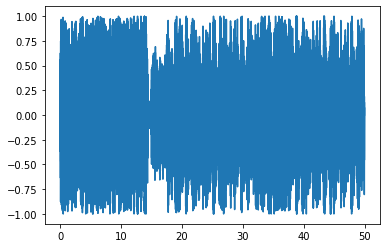

In [ ]:
wave3.plot()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from thinkdsp import decorate

In [ ]:
from thinkdsp import Chirp
from thinkdsp import normalize, unbias

PI2 = 2 * np.pi

class SawtoothChirp(Chirp):
    """Represents a sawtooth signal with varying frequency."""

    def evaluate(self, ts):
        """Helper function that evaluates the signal.

        ts: float array of times
        """
        freqs = np.linspace(self.start, self.end, len(ts))
        dts = np.diff(ts, prepend=0)
        dphis = PI2 * freqs * dts
        phases = np.cumsum(dphis)
        cycles = phases / PI2
        frac, _ = np.modf(cycles)
        ys =  normalize(unbias(frac), self.amp)
        return ys

In [ ]:
signal = SawtoothChirp(start=200, end=880)
wave = signal.make_wave(duration=1, framerate=4000)
wave.apodize()
wave.make_audio()

In [ ]:
signal = SawtoothChirp(start=880, end=200)
wave = signal.make_wave(duration=1, framerate=4000)
wave.apodize()
wave.make_audio()

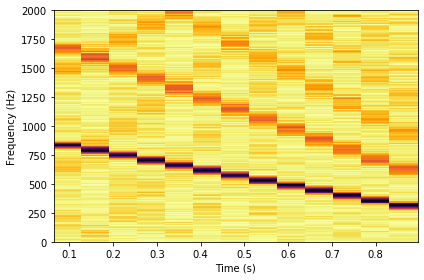

In [ ]:
sp = wave.make_spectrogram(512)
sp.plot()
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')

In [ ]:
if not os.path.exists('72475__rockwehrmann__glissup02.wav'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/72475__rockwehrmann__glissup02.wav

In [ ]:
wave = read_wave('72475__rockwehrmann__glissup02.wav')
wave.make_audio()

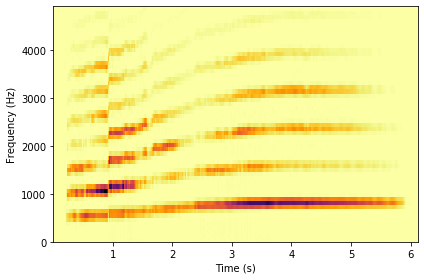

In [ ]:
wave.make_spectrogram(512).plot(high=5000)
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')

In [ ]:
class TromboneGliss(Chirp):
    """Represents a trombone-like signal with varying frequency."""
    
    def evaluate(self, ts):
        """Evaluates the signal at the given times.

        ts: float array of times
        
        returns: float wave array
        """
        l1, l2 =  self.start, self.end
        lengths = np.linspace(l1, l2, len(ts))
        freqs = lengths
        
        dts = np.diff(ts, prepend=0)
        dphis = PI2 * freqs * dts
        phases = np.cumsum(dphis)
        ys = self.amp * np.cos(phases)
        return ys

In [ ]:
low = 262
high = 349
signal = TromboneGliss(high, low)
wave1 = signal.make_wave(duration=1)
wave1.apodize()
wave1.make_audio()

In [ ]:
signal = TromboneGliss(low, high)
wave2 = signal.make_wave(duration=1)
wave2.apodize()
wave2.make_audio()

In [ ]:
wave = wave1 | wave2 # or 
wave.make_audio()

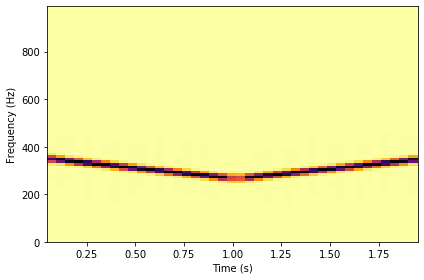

In [ ]:
sp = wave.make_spectrogram(1024)
sp.plot(high=1000)
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')

In [ ]:
if not os.path.exists('87778__marcgascon7__vocals.wav'):
    !wget https://github.com/AllenDowney/ThinkDSP/raw/master/code/87778__marcgascon7__vocals.wav

In [ ]:
wave = read_wave('87778__marcgascon7__vocals.wav')
wave.make_audio()

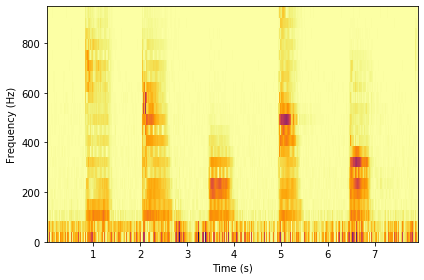

In [ ]:
wave.make_spectrogram(1024).plot(high=1000)
decorate(xlabel='Time (s)', ylabel='Frequency (Hz)')